<a href="https://colab.research.google.com/github/bd1ng/xdeep/blob/main/featureviz.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AIPI 590 - XAI | Assignment #05
### Uses optimization for feature visualization in VGG16's classification of a German Shephard, based on methods detailed in "Feature Visualization" by Olah, et al.✝  Includes classification, feature visualization of a single channel sample (random), visualization of random channels for all convolutional layers, and a visualization of channels with the highest contribution to classification in early, middle, and end layers.

### ✝ https://distill.pub/2017/feature-visualization/

### Bochu Ding

Example:

[![Open In Collab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/bd1ng/xdeep/blob/main/featureviz.ipynb)

# GenAI Use

I queried ChatGPT for a skeleton of the following code, since there wasn't an example notebook to reference. You can find my conversation (initially with o1, which began at 8:52p on Feb 12, then with 4o) here: https://chatgpt.com/share/67ad5742-6f14-8003-a7a3-e667dc70116d

Below, I will also note where I made changes to the skeleton provided by GPTo1.

# 0. Set-up

In [ ]:
# Install Packages (Suggested by o1)
!pip install torch==2.5.1 torchvision==0.20.1 #added versions on installs for consistency

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 47.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 58.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
# Import Libraries (Suggested by o1)
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import json
import urllib.request
import random
import math
import os


In [ ]:
# Mount Drive for Reference Photo
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1(a). Classification Set-up

In [ ]:
# Define Model (Written by o1, model suggested by o1)
model = models.vgg16(pretrained=True) #Using VGG16 per skeleton.
model.eval()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:08<00:00, 67.5MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# Create Forward Hook in Pytorch (Written by o1)
activation = {}

def hook_fn(module, input, output):
    activation["value"] = output

hook = selected_layer.register_forward_hook(hook_fn)

In [ ]:
# Import Image (Written by 4o after refinement on Feb 12 at 9:12p)
image_path = "/content/drive/MyDrive/SD_LSA/doggo.png"

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

image = Image.open(image_path).convert("RGB")
input_img = transform(image).unsqueeze(0)
input_img.requires_grad = True

# 1(b). Classification Results

In [ ]:
# Run Classification (Written by 4o on Feb 12 at 9:34p)
input_tensor = input_img
with torch.no_grad():
    output = model(input_tensor)  # Forward pass
probs = torch.nn.functional.softmax(output[0], dim=0)
predicted_class = torch.argmax(probs).item()

# Output Classification Label
url = "https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json"
class_index = json.load(urllib.request.urlopen(url))
class_label = class_index[str(predicted_class)][1]
print(f"Predicted Class: {class_label}")

Predicted Class: German_shepherd


# 2. Single Feature Visualization

In [ ]:
# Select Layer and Channel (Written by o1)
selected_layer = model.features[12]
channel_idx = 2

In [ ]:
# Define optimizer and L2 reg weight for gradient ascent (Written by o1)
optimizer = optim.Adam([input_img], lr=0.1)
reg_weight = 1e-4

In [ ]:
# Gradient Ascent (Written by o1, this is very much beyond my paygrade)

num_iterations = 80

for i in range(num_iterations):
    optimizer.zero_grad()

    # Forward pass
    _ = model(input_img)

    # The activation has shape: (batch_size, num_channels, feature_map_height, feature_map_width)
    layer_activation = activation["value"]

    # We pick out the channel we want
    channel_activation = layer_activation[:, channel_idx, :, :]

    # The objective is to maximize the mean activation of that channel
    loss = -channel_activation.mean()

    # Add a simple L2 penalty on the image to keep it from going off to extreme values
    loss = loss + reg_weight * (input_img**2).mean()

    # Backprop
    loss.backward()

    # Update the image
    optimizer.step()

    # Optionally clamp the image values (not strictly necessary, but can help)
    # input_img.data.clamp_(-1.0, 1.0)

    if i % 10 == 0:
        print(f"Iteration {i}, Loss = {loss.item():.4f}")

Iteration 0, Loss = -1.8575
Iteration 10, Loss = -47.5048
Iteration 20, Loss = -86.0073
Iteration 30, Loss = -126.2032
Iteration 40, Loss = -169.0929
Iteration 50, Loss = -214.6452
Iteration 60, Loss = -262.4178
Iteration 70, Loss = -312.0663


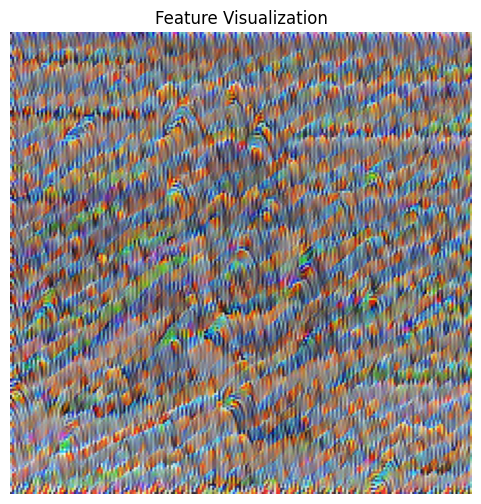

Image saved.


In [ ]:
# Print result (Written by o1)
result = input_img.detach().numpy()[0]
result = np.transpose(result, (1, 2, 0))
min_val = result.min()
max_val = result.max()
result = (result - min_val) / (max_val - min_val + 1e-5)
plt.figure(figsize=(6, 6))
plt.imshow(result)
plt.axis('off')
plt.title("Feature Visualization")
plt.show()

# Save result (Written by 4o on Feb 12 at 9:27p))
image_path = "/content/drive/MyDrive/SD_LSA/result.png"
result_255 = (result * 255).astype(np.uint8)
image = Image.fromarray(result_255)
image.save(image_path)
print(f"Image saved.")

# 3. Feature Visualization Sampling

I'm realizing at this point that it's not particularly helpful to view just one step of the process. Here, I elicit the help of o1 (again) to create a loop that randomly selects one channel from each layer to visualize.

In [ ]:
# Examine model
print(model)

# Identify convolution layers
conv_layers_indices = [0, 2, 5, 7, 10, 12, 14, 17, 19, 21, 24, 26, 28]

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# Create Helper Function for Random Channel (Generated with o1 on Feb 12 at 9:55p)

def visualize_random_channel(model, layer_index, num_iterations=50, lr=0.1, reg_weight=1e-4):
    layer = model.features[layer_index]
    out_channels = layer.out_channels
    channel_idx = random.randint(0, out_channels - 1)
    activation = {}
    def hook_fn(module, input, output):
        activation["value"] = output

    hook_handle = layer.register_forward_hook(hook_fn)

    input_img = torch.randn(1, 3, 224, 224, requires_grad=True)

    optimizer = optim.Adam([input_img], lr=lr)

    for i in range(num_iterations):
        optimizer.zero_grad()
        _ = model(input_img)
        layer_activation = activation["value"]
        channel_activation = layer_activation[:, channel_idx, :, :]
        loss = -channel_activation.mean()
        loss += reg_weight * (input_img**2).mean()
        loss.backward()
        optimizer.step()
    hook_handle.remove()

    result = input_img.detach().numpy()[0]
    result = np.transpose(result, (1, 2, 0))

    min_val = result.min()
    max_val = result.max()
    result = (result - min_val) / (max_val - min_val + 1e-5)

    return channel_idx, result

all_visualizations = []  # Store (layer_idx, channel_idx, image_np)

for layer_idx in conv_layers_indices:
    channel_idx, image_np = visualize_random_channel(model, layer_idx)
    all_visualizations.append((layer_idx, channel_idx, image_np))

    print(f"Layer {layer_idx}, Random Channel {channel_idx} visualization complete.")

Layer 0, Random Channel 37 visualization complete.
Layer 2, Random Channel 7 visualization complete.
Layer 5, Random Channel 83 visualization complete.
Layer 7, Random Channel 75 visualization complete.
Layer 10, Random Channel 19 visualization complete.
Layer 12, Random Channel 182 visualization complete.
Layer 14, Random Channel 152 visualization complete.
Layer 17, Random Channel 108 visualization complete.
Layer 19, Random Channel 396 visualization complete.
Layer 21, Random Channel 42 visualization complete.
Layer 24, Random Channel 97 visualization complete.
Layer 26, Random Channel 96 visualization complete.
Layer 28, Random Channel 217 visualization complete.


In [ ]:
# Repeated with input image for future attribution visualization

def visualize_random_channel(model, layer_index, num_iterations=50, lr=0.1, reg_weight=1e-4):
    layer = model.features[layer_index]
    out_channels = layer.out_channels
    channel_idx = random.randint(0, out_channels - 1)
    activation = {}
    def hook_fn(module, input, output):
        activation["value"] = output

    hook_handle = layer.register_forward_hook(hook_fn)

    input_img = input_tensor

    optimizer = optim.Adam([input_img], lr=lr)

    for i in range(num_iterations):
        optimizer.zero_grad()
        _ = model(input_img)
        layer_activation = activation["value"]
        channel_activation = layer_activation[:, channel_idx, :, :]
        loss = -channel_activation.mean()
        loss += reg_weight * (input_img**2).mean()
        loss.backward()
        optimizer.step()
    hook_handle.remove()

    result = input_img.detach().numpy()[0]
    result = np.transpose(result, (1, 2, 0))

    min_val = result.min()
    max_val = result.max()
    result = (result - min_val) / (max_val - min_val + 1e-5)

    return channel_idx, result

all_visualizations = []  # Store (layer_idx, channel_idx, image_np)

for layer_idx in conv_layers_indices:
    channel_idx, image_np = visualize_random_channel(model, layer_idx)
    all_visualizations.append((layer_idx, channel_idx, image_np))

    print(f"Layer {layer_idx}, Random Channel {channel_idx} visualization complete.")

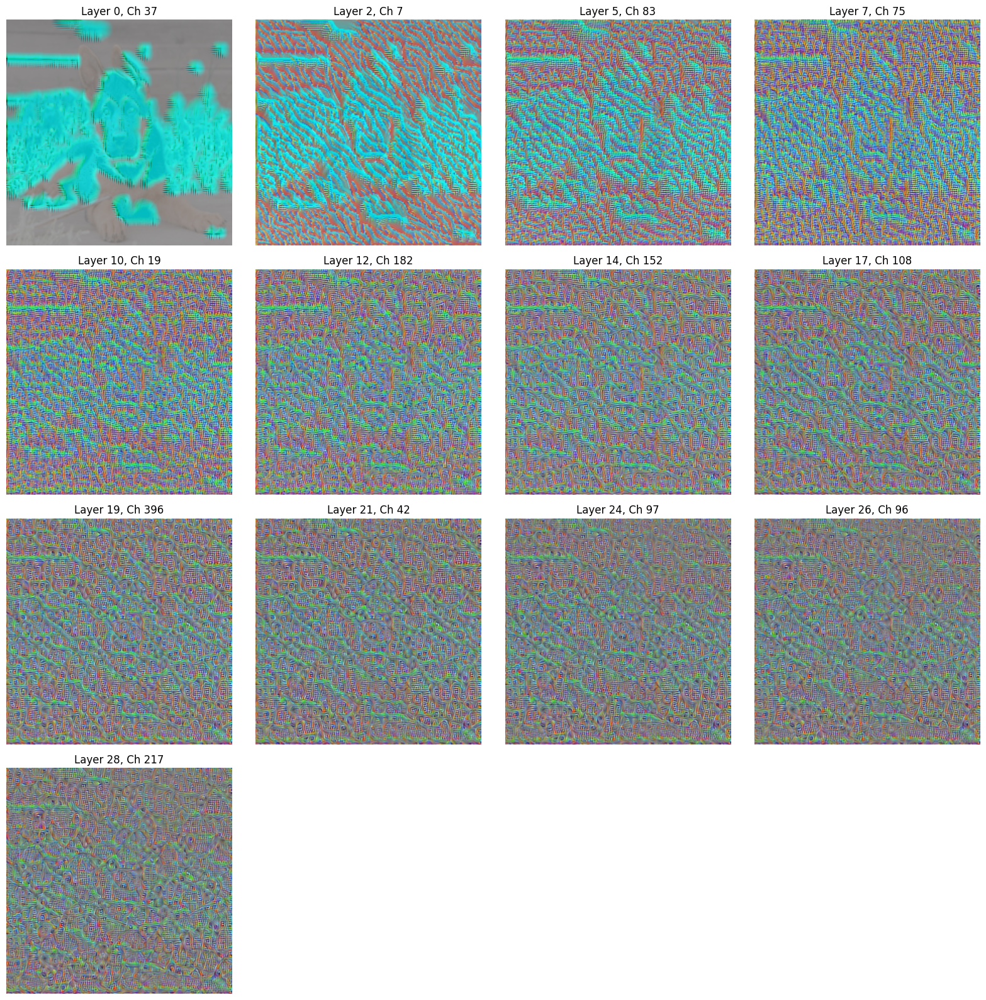

Saved /content/drive/MyDrive/SD_LSA/layer_0_channel_37.png
Saved /content/drive/MyDrive/SD_LSA/layer_2_channel_7.png
Saved /content/drive/MyDrive/SD_LSA/layer_5_channel_83.png
Saved /content/drive/MyDrive/SD_LSA/layer_7_channel_75.png
Saved /content/drive/MyDrive/SD_LSA/layer_10_channel_19.png
Saved /content/drive/MyDrive/SD_LSA/layer_12_channel_182.png
Saved /content/drive/MyDrive/SD_LSA/layer_14_channel_152.png
Saved /content/drive/MyDrive/SD_LSA/layer_17_channel_108.png
Saved /content/drive/MyDrive/SD_LSA/layer_19_channel_396.png
Saved /content/drive/MyDrive/SD_LSA/layer_21_channel_42.png
Saved /content/drive/MyDrive/SD_LSA/layer_24_channel_97.png
Saved /content/drive/MyDrive/SD_LSA/layer_26_channel_96.png
Saved /content/drive/MyDrive/SD_LSA/layer_28_channel_217.png


In [ ]:
# Visualize and Save (Generated with o1 on Feb 12 at 9:55p)

# Visualize
num_layers = len(all_visualizations)
cols = 4
rows = math.ceil(num_layers / cols)
fig, axs = plt.subplots(rows, cols, figsize=(16, 4*rows))

for idx, (layer_idx, channel_idx, viz_img) in enumerate(all_visualizations):
    row, col = divmod(idx, cols)
    ax = axs[row][col] if rows > 1 else axs[col]

    ax.imshow(viz_img)
    ax.set_title(f"Layer {layer_idx}, Ch {channel_idx}")
    ax.axis('off')

for extra_idx in range(idx+1, rows*cols):
    row, col = divmod(extra_idx, cols)
    fig.delaxes(axs[row][col] if rows > 1 else axs[col])

plt.tight_layout()
plt.show()

# Save

save_path = "/content/drive/MyDrive/SD_LSA"
os.makedirs(save_path, exist_ok=True)

for layer_idx, channel_idx, viz_img in all_visualizations:
    img_to_save = (viz_img * 255).astype(np.uint8)
    pil_img = Image.fromarray(img_to_save)

    filename = f"layer_{layer_idx}_channel_{channel_idx}.png"
    path = os.path.join(save_path, filename)
    pil_img.save(path)
    print(f"Saved {path}")

# 4. Highest-Prediction Sampling

Upon revisiting Olah, et al., I'm realizing it might make sense to try to identify the channels with the highest predictive power. Given the time and resource constraints, I'll pick two layers from the early, middle, and late convolutional layers, and generate visualizations for three channels from each layer

In [ ]:
# Idenitfy layers of interest
layers_of_interest = [2, 5, 14, 19, 24, 26]

In [ ]:
# Create hook dictionaries (Generated with o1 on Feb 12 at 11:19p)
activation_dict = {}
gradient_dict = {}

def make_forward_hook(idx):
    def forward_hook(module, inp, out):
        activation_dict[idx] = out
    return forward_hook

def make_backward_hook(idx):
    def backward_hook(module, grad_in, grad_out):
        gradient_dict[idx] = grad_out[0]
    return backward_hook

# Register Hooks (Generated with o1 on Feb 12 at 11:19p)
handles = []
for layer_idx in layers_of_interest:
    layer = model.features[layer_idx]
    handles.append(layer.register_forward_hook(make_forward_hook(layer_idx)))
    handles.append(layer.register_backward_hook(make_backward_hook(layer_idx)))

In [ ]:
# Set-up input img again

image_path = "/content/drive/MyDrive/SD_LSA/doggo.png"

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

image = Image.open(image_path).convert("RGB")
input_img = transform(image).unsqueeze(0)
input_img.requires_grad = True

In [ ]:
# Computer Layer Importance (Generated with o1 on Feb 12 at 11:19p)

# Forward Pass
output = model(input_tensor)
pred_class = output.argmax(dim=1).item()

# Output Classification Label
url = "https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json"
class_index = json.load(urllib.request.urlopen(url))
class_label = class_index[str(pred_class)][1]
print(f"Predicted Class: {class_label}")

print("Predicted class index:", pred_class)

# Backward Pass
model.zero_grad()
pred_logit = output[0, pred_class]
pred_logit.backward()

Predicted Class: German_shepherd
Predicted class index: 235


In [ ]:
# Compute Channel Importance (Generated with o1 on Feb 12 at 11:19p)

top_k = 3
top_channels_per_layer = {}

for layer_idx in layers_of_interest:
    layer_grad = gradient_dict[layer_idx].detach()
    channel_importance = layer_grad.abs().sum(dim=(0,2,3))

    vals, inds = torch.topk(channel_importance, k=top_k, largest=True)
    top_channels_per_layer[layer_idx] = inds.cpu().numpy()

for layer_idx in layers_of_interest:
    print(f"Layer {layer_idx}, top-3 channel indices:", top_channels_per_layer[layer_idx])


Layer 2, top-3 channel indices: [41 56 36]
Layer 5, top-3 channel indices: [ 53 114  35]
Layer 14, top-3 channel indices: [ 87  35 243]
Layer 19, top-3 channel indices: [454 120 325]
Layer 24, top-3 channel indices: [130  77 499]
Layer 26, top-3 channel indices: [454 511 266]


In [ ]:
# Visualization Function (Generated with o1 on Feb 12 at 11:19p)

def visualize_channel(model, layer_index, channel_idx,
                      num_iterations=50, lr=0.1, reg_weight=1e-4):

    layer = model.features[layer_index]

    act_dict = {}
    def hook_fn(module, inp, out):
        act_dict["value"] = out

    hook_handle = layer.register_forward_hook(hook_fn)

    input_img = torch.randn(1, 3, 224, 224, requires_grad=True)
    optimizer = optim.Adam([input_img], lr=lr)

    for i in range(num_iterations):
        optimizer.zero_grad()
        model(input_img)

        act = act_dict["value"]
        ch_activation = act[:, channel_idx, :, :]
        loss = -ch_activation.mean()

        loss += reg_weight * (input_img ** 2).mean()

        loss.backward()
        optimizer.step()

    hook_handle.remove()

    result = input_img.detach().numpy()[0]
    result = np.transpose(result, (1, 2, 0))
    min_val, max_val = result.min(), result.max()
    result = (result - min_val) / (max_val - min_val + 1e-5)
    return result


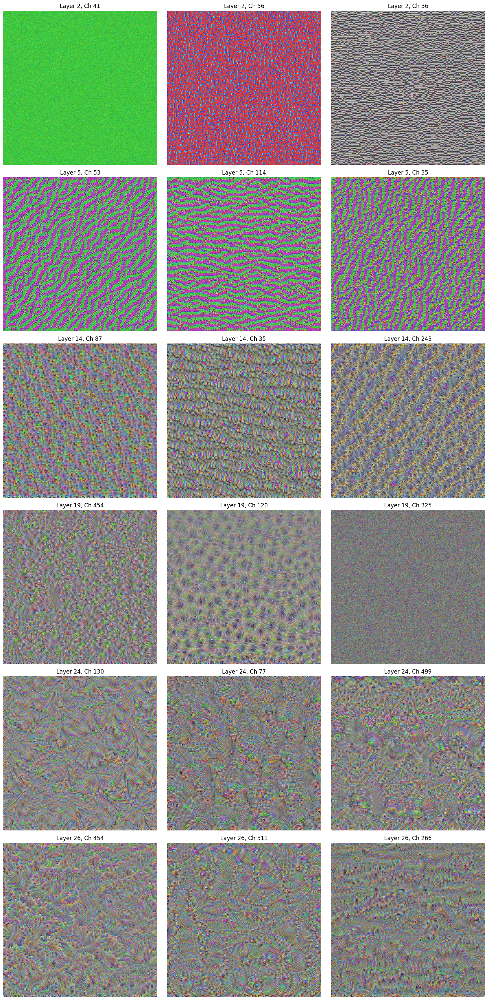

Saved /content/drive/MyDrive/SD_LSA/layer_0_channel_37.png
Saved /content/drive/MyDrive/SD_LSA/layer_2_channel_7.png
Saved /content/drive/MyDrive/SD_LSA/layer_5_channel_83.png
Saved /content/drive/MyDrive/SD_LSA/layer_7_channel_75.png
Saved /content/drive/MyDrive/SD_LSA/layer_10_channel_19.png
Saved /content/drive/MyDrive/SD_LSA/layer_12_channel_182.png
Saved /content/drive/MyDrive/SD_LSA/layer_14_channel_152.png
Saved /content/drive/MyDrive/SD_LSA/layer_17_channel_108.png
Saved /content/drive/MyDrive/SD_LSA/layer_19_channel_396.png
Saved /content/drive/MyDrive/SD_LSA/layer_21_channel_42.png
Saved /content/drive/MyDrive/SD_LSA/layer_24_channel_97.png
Saved /content/drive/MyDrive/SD_LSA/layer_26_channel_96.png
Saved /content/drive/MyDrive/SD_LSA/layer_28_channel_217.png


In [ ]:
# Visualize (Generated with o1 on Feb 12 at 11:19p)

# Visualize
results = []
for layer_idx in layers_of_interest:
    ch_indices = top_channels_per_layer[layer_idx]
    for ch in ch_indices:
        viz_img = visualize_channel(model, layer_idx, ch)
        results.append((layer_idx, ch, viz_img))

# Display in a grid
n = len(results)
cols = 3  # 3 channels per row (for each layer)
rows = math.ceil(n / cols)
fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))

for i, (layer_idx, ch_idx, img_np) in enumerate(results):
    r, c = divmod(i, cols)
    # If there's only one row, axs is 1D; otherwise, 2D
    ax = axs[r][c] if rows > 1 else axs[c]
    ax.imshow(img_np)
    ax.set_title(f"Layer {layer_idx}, Ch {ch_idx}")
    ax.axis('off')

plt.tight_layout()
plt.show()
